# Cityscapes - Resnet50 - to .py

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchsummary import summary
#import torchinfo
import json
from torchvision.models.segmentation import fcn
from matplotlib import cm
import signal

from torch.utils.tensorboard import SummaryWriter

In [2]:
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device("cuda:0")
print("Device chosen GPU:", torch.cuda.get_device_name(device))

# Parameters
num_classes = 35

# Hyper parameters
num_epochs = 12
batch_size = 2
learning_rate = 0.0001
beta1 = 0.9
beta2 = 0.999
log_directory = f"runs/Cityscapes/resnet50/v0.1.4 Adam lr = {learning_rate}, epochs = {num_epochs}, batchsize ={batch_size}"
writer  = SummaryWriter(log_directory)

Device chosen GPU: NVIDIA TITAN RTX


In [3]:
transform = transforms.Compose(
    [
        transforms.ToTensor()
    ]
)

def pil_to_np(img):
    return np.array(img) 

# The Cityscapes dataset is avaliable in PyTorch
train_dataset = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='train', mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)
#test_dataset  = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='test',  mode='fine', target_type='semantic', transform=pil_to_tensor, target_transform=transforms.ToTensor())
val_dataset   = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='val',   mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)

# Splitting the training and testing datasets into smaller batches
workers = 5
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)#,  num_workers=workers)#, pin_memory=True))
#test_loader  = torch.utils.data.DataLoader(dataset=test_dataset,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))
val_loader   = torch.utils.data.DataLoader(dataset=val_dataset,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))

#print('Train Size: ', len(train_dataset))
#print('Test Size : ', len(test_dataset))
#print('Val Size  : ', len(val_dataset))

'''Plot from dataset'''
# fig, ax = plt.subplots(ncols=2, figsize=(24, 16))
# ax[0].imshow(np.array(train_dataset[1][0]).transpose(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
# ax[1].imshow(np.array(train_dataset[1][1]))

'''Plot from dataloader''';
# plot_img, plot_target = next(iter(val_loader))
# plot_img = plot_img[0]
# plot_target = plot_target[0]
# print(plot_img.shape)
# print(plot_target.shape)

# fig, ax = plt.subplots(ncols=2, figsize=(24, 16))
# ax[0].imshow(np.array(plot_img).transpose(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
# ax[1].imshow(np.array(plot_target))

In [6]:
'''Loading saved model''';
model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)
optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-08)

loaded_checkpoint = torch.load("checkpoint_resnet50_0.5epoch_cityscapes.pth")

# for param in model.parameters():    # Freezing the startign layers
#     # param.requires_grad = False
#     param.requires_grad = False

model.load_state_dict(loaded_checkpoint["model_state"])
optimiser.load_state_dict(loaded_checkpoint["optimiser_state"])
epoch = loaded_checkpoint["epoch"]
criterion = nn.CrossEntropyLoss()

In [5]:
'''Loading new model''';
model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)

# Finetuning
# for param in model.parameters():    # Freezing/unfreezing the starting layers
#     # param.requires_grad = False
#     param.requires_grad = False

optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-8)
criterion = nn.CrossEntropyLoss()


Starting training


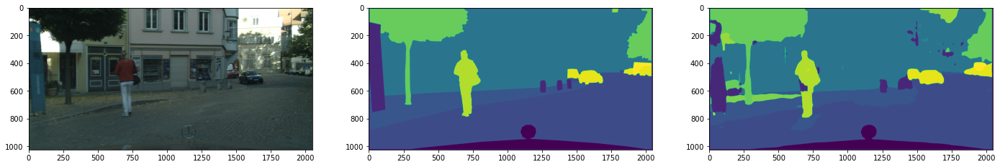

Epoch 1/12, step 5/1488, loss = 0.20977


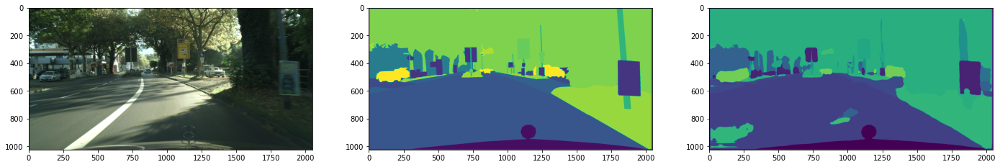

Epoch 1/12, step 10/1488, loss = 0.23479


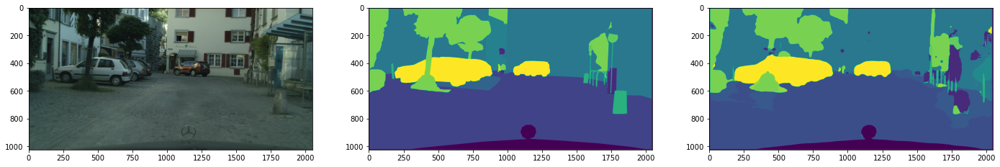

Epoch 1/12, step 15/1488, loss = 0.13535


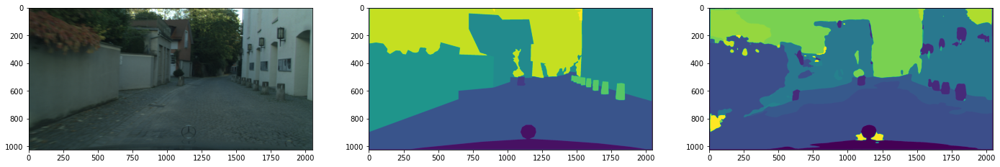

Epoch 1/12, step 20/1488, loss = 0.20071


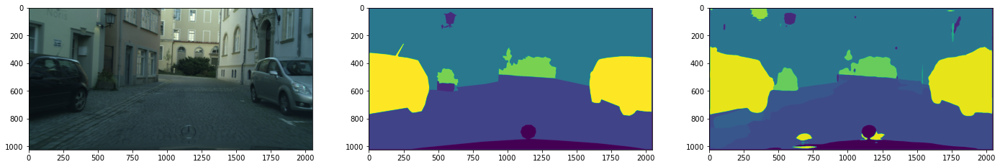

Epoch 1/12, step 25/1488, loss = 0.47923


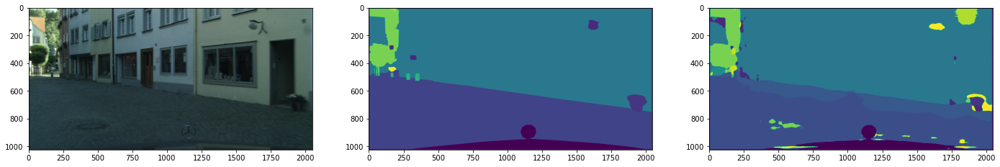

Epoch 1/12, step 30/1488, loss = 0.24671


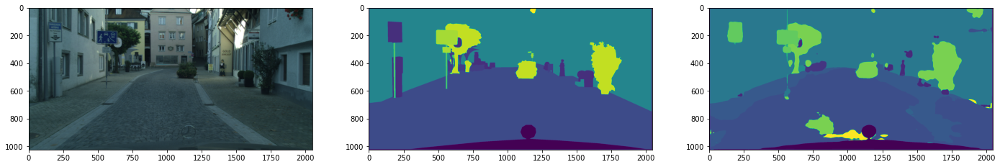

Epoch 1/12, step 35/1488, loss = 0.38332


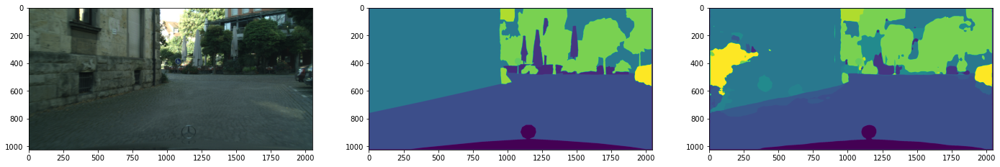

Epoch 1/12, step 40/1488, loss = 0.27072


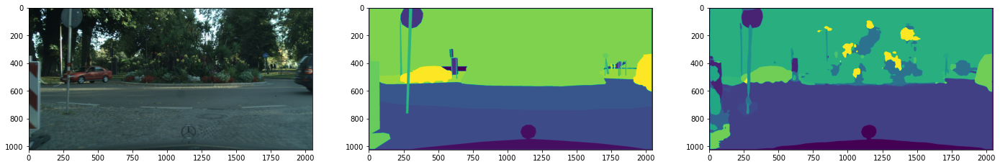

Epoch 1/12, step 45/1488, loss = 0.36904


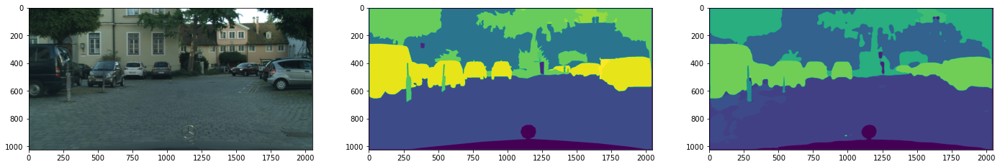

Epoch 1/12, step 50/1488, loss = 0.31538


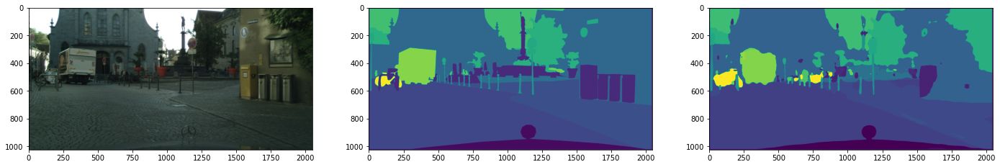

Epoch 1/12, step 55/1488, loss = 0.17474


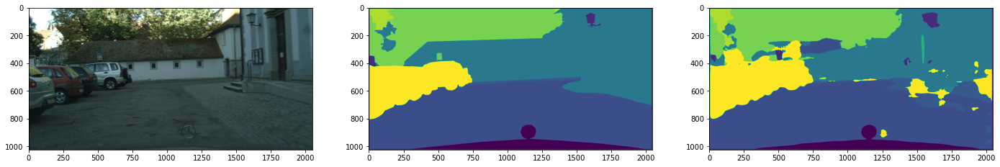

Epoch 1/12, step 60/1488, loss = 0.85477


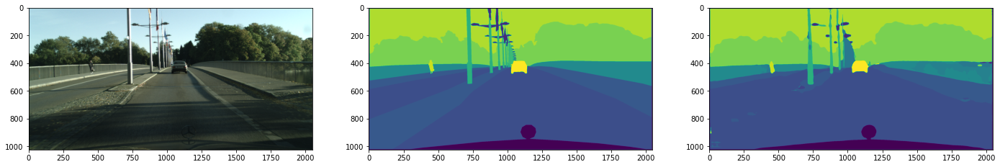

Epoch 1/12, step 65/1488, loss = 0.50841


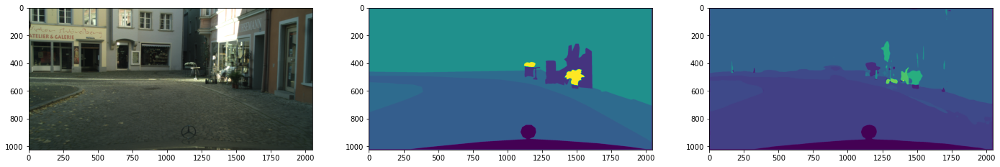

Epoch 1/12, step 70/1488, loss = 0.25327


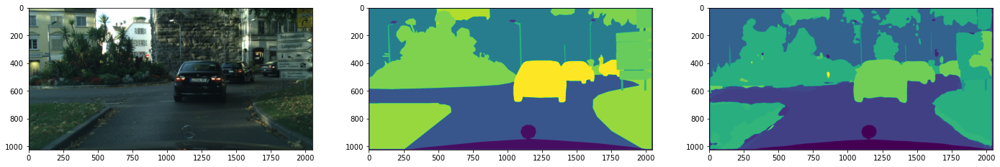

Epoch 1/12, step 75/1488, loss = 0.21185


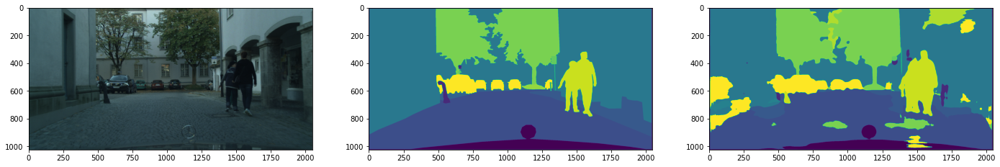

Epoch 1/12, step 80/1488, loss = 0.25901


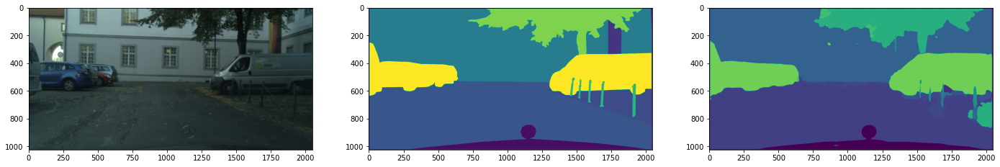

Epoch 1/12, step 85/1488, loss = 0.30406


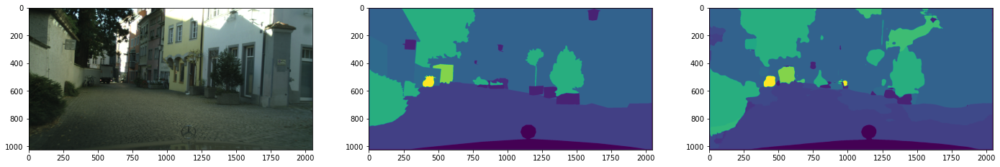

Epoch 1/12, step 90/1488, loss = 0.26409


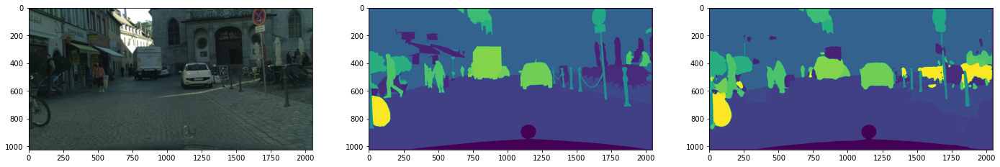

Epoch 1/12, step 95/1488, loss = 0.24779


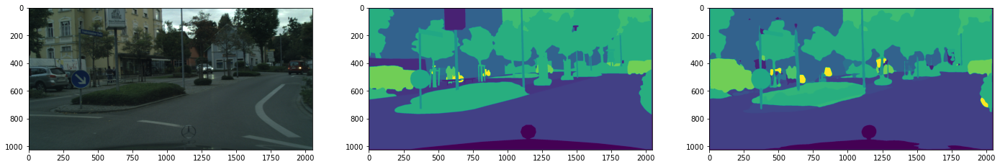

Epoch 1/12, step 100/1488, loss = 0.25505


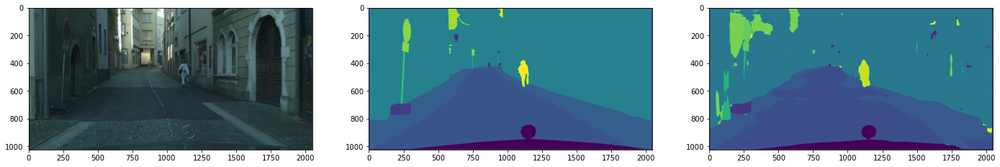

Epoch 1/12, step 105/1488, loss = 0.28638


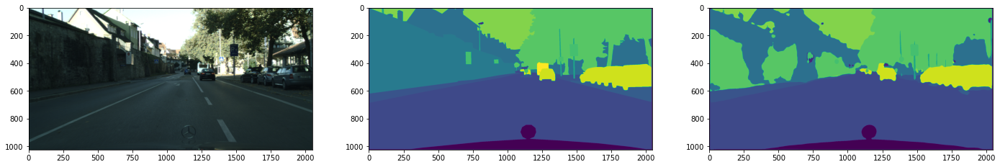

Epoch 1/12, step 110/1488, loss = 0.49165


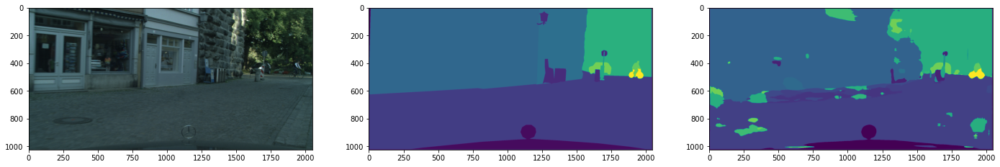

Epoch 1/12, step 115/1488, loss = 0.44012


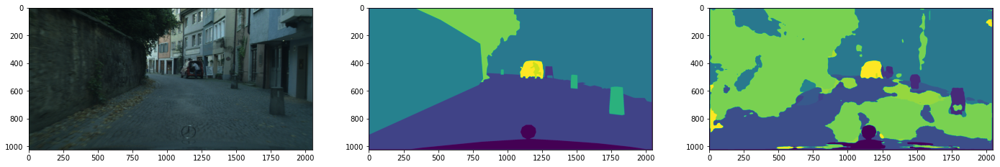

Epoch 1/12, step 120/1488, loss = 0.22171


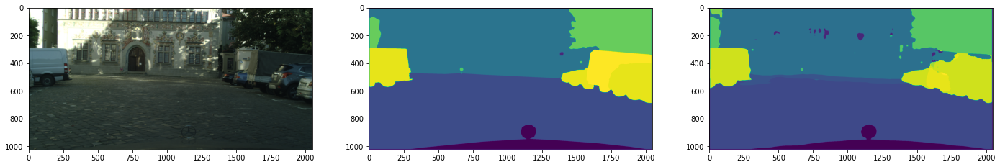

Epoch 1/12, step 125/1488, loss = 0.21867


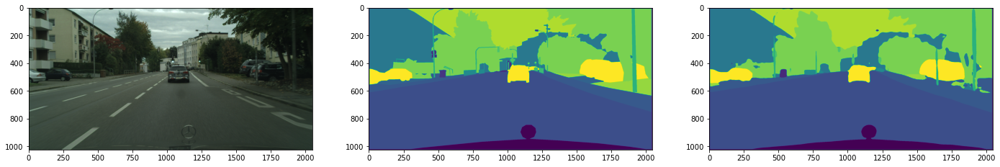

Epoch 1/12, step 130/1488, loss = 0.38261


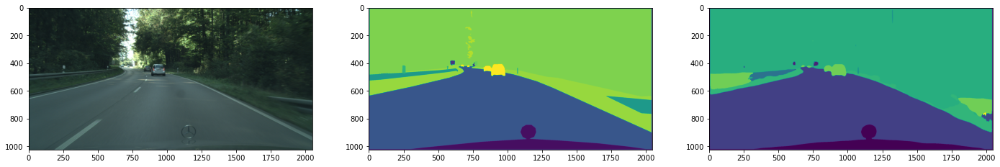

Epoch 1/12, step 135/1488, loss = 0.31869


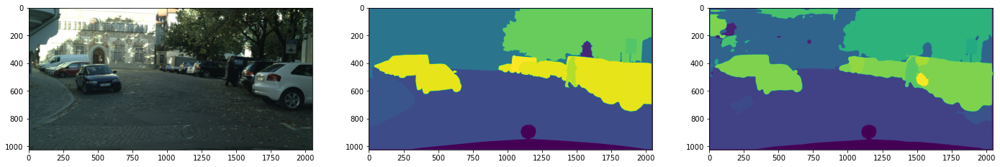

Epoch 1/12, step 140/1488, loss = 0.25410


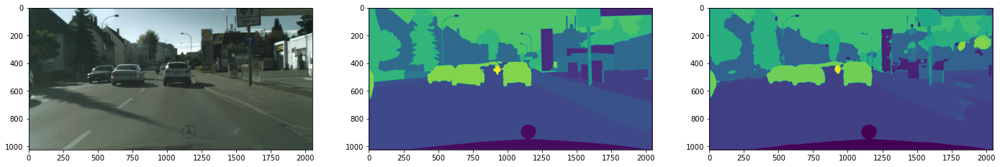

Epoch 1/12, step 145/1488, loss = 0.13784


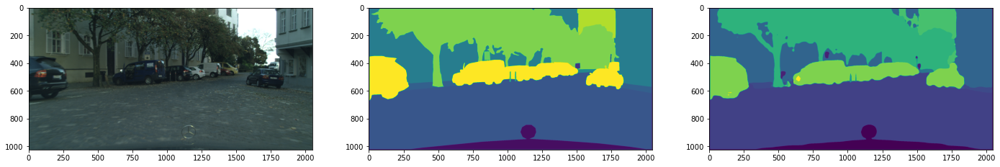

Epoch 1/12, step 150/1488, loss = 0.35971


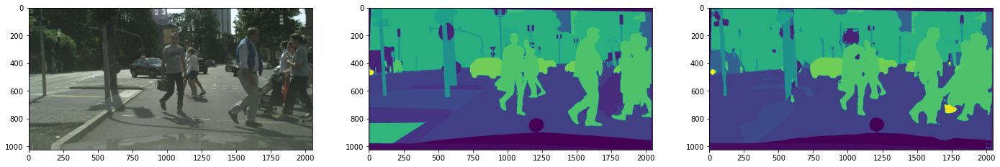

Epoch 1/12, step 155/1488, loss = 0.20795


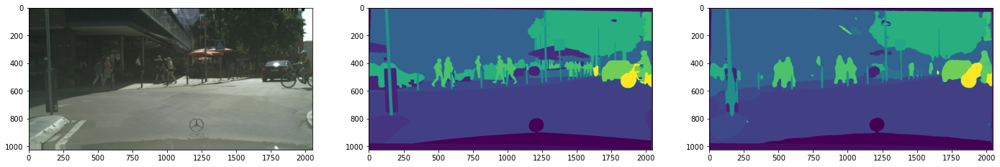

Epoch 1/12, step 160/1488, loss = 0.29073


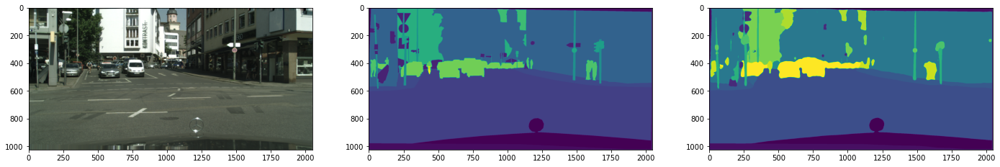

Epoch 1/12, step 165/1488, loss = 0.36051


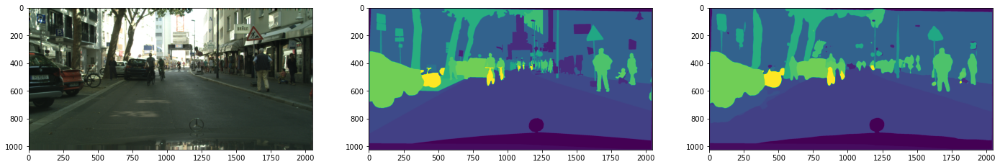

Epoch 1/12, step 170/1488, loss = 0.26234


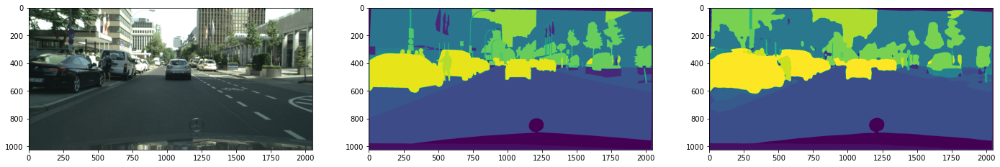

Epoch 1/12, step 175/1488, loss = 0.12002


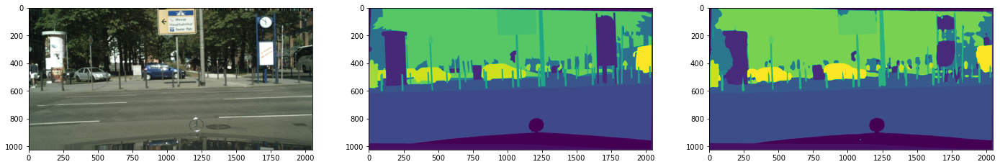

Epoch 1/12, step 180/1488, loss = 0.17934


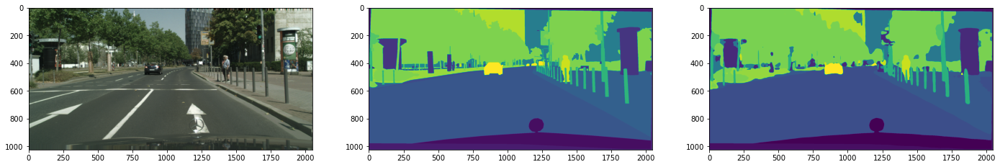

Epoch 1/12, step 185/1488, loss = 0.40913


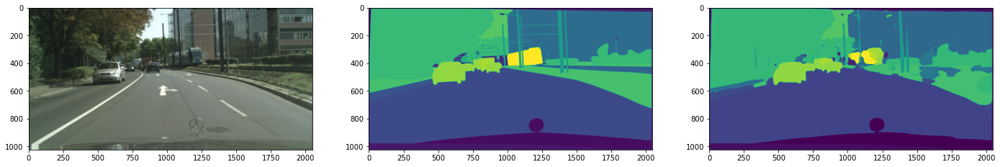

Epoch 1/12, step 190/1488, loss = 0.17843


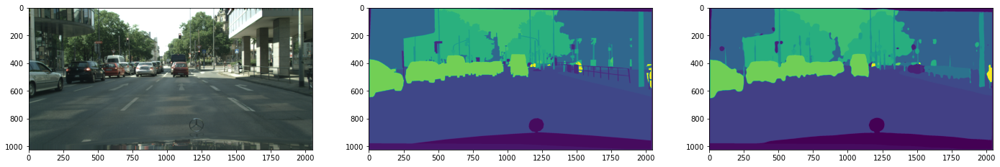

Epoch 1/12, step 195/1488, loss = 0.18038


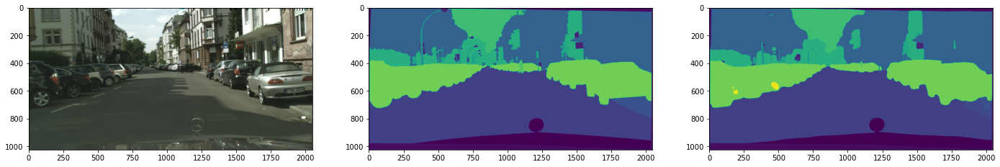

Epoch 1/12, step 200/1488, loss = 0.24350


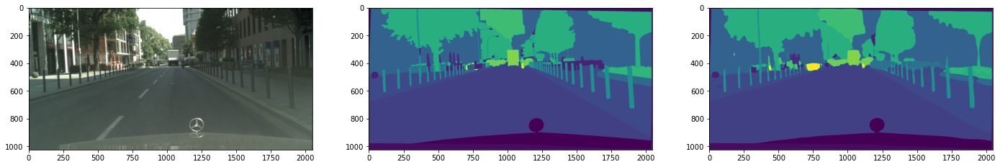

Epoch 1/12, step 205/1488, loss = 0.29262


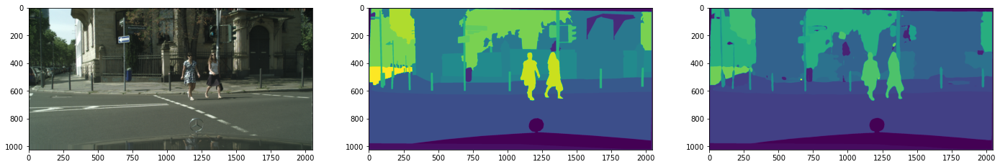

Epoch 1/12, step 210/1488, loss = 0.28301


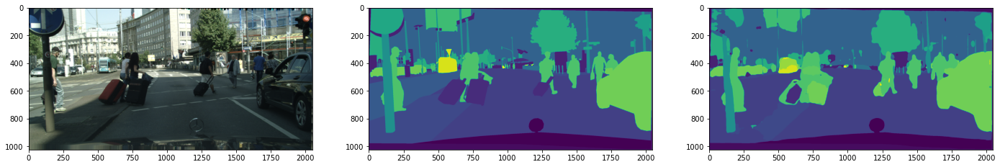

Epoch 1/12, step 215/1488, loss = 0.30870
Training is done


In [7]:
'''Training'''
# Tensorboard
#writer.add_graph(model.cpu(), val_dataset[0][0])
#writer.close()

# Doing the training now

n_total_steps = len(train_loader)

steps_until_print = batch_size

# stop_training = False
# def signal_handler(sig, frame):
#     print('\nDetected Ctrl+C, stopping training')
#     stop_training = True
#     print('Saving model')
# signal.signal(signal.SIGINT, signal_handler)

model.train()
print('Starting training')
for epoch in range(num_epochs):
    #if stop_training: break

    # Check for stop - read file for boolean to stopping safely
    with open("train.json") as train_json:
        train_dict = json.load(train_json)
        if train_dict["train"] == "False": break

    testing_batches = iter(val_loader) # Every epoch tests the whole dataset once

    for i, (images, targets) in enumerate(train_loader):
            # Check for stop - read file for boolean to stopping safely
        with open("train.json") as train_json:
            train_dict = json.load(train_json)
            if train_dict["train"] == "False": break

        images = images.to(device)
        targets = targets.to(device)
        # print('images  shape:', images.shape)
        # print('targets shape:', targets.shape)

        # Forward pass
        outputs = model(images)['out']
        # print("outputs shape:", outputs.shape)
      
        loss = criterion(outputs, targets.long())

        # Backward pass
        optimiser.zero_grad()   # Clear old gradient values
        loss.backward()         # Calculate the gradients
        optimiser.step()        # Update the model's weights - seen at model.parameters()

        with torch.no_grad():

            # Logging the train accuracy
            pred = torch.argmax(outputs, dim=1)     # Evaluate along the 1st dimension
            batch_pixel_accuracy = (pred == targets).sum().item()/(batch_size*pred.shape[1]*pred.shape[2])
            writer.add_scalar('Accuracy/training', batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

            # Logging the train loss
            writer.add_scalar('Loss/training', loss.item()/steps_until_print, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

            # For every 5 batches, test one batch. (test:train data ratio is split 1:5)
            if (i+1) % 5 == 0:  # Logging the testing loss
                test_images, test_targets = testing_batches.next()
                
                test_images = test_images.to(device)
                test_targets = test_targets.to(device).squeeze(1)

                model.eval()
                test_outputs = model(test_images)['out']
                model.train()
                    
                test_pred = torch.argmax(test_outputs, dim=1)

                '''Plot test results'''
                fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
                ax[0].imshow(test_images[0].to('cpu').squeeze().permute(1,2,0))  # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
                ax[1].imshow(test_targets[0].to('cpu').squeeze()) # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
                ax[2].imshow(test_pred[0].cpu().detach())
                plt.pause(0.01)
                '''                     '''

                # print('test_images  shape:', test_images.shape)
                # print('test_targets shape:', test_targets.shape)
                # print('test_outputs shape:', test_outputs.shape)
                # print('test_pred    shape:', test_pred.shape)

                # writer.add_images('test/images',      test_images                  , epoch * n_total_steps + i)
                # writer.add_images('test/targets',     test_targets.unsqueeze(dim=1), epoch * n_total_steps + i)
                # writer.add_images('test/predictions', test_pred.unsqueeze(dim=1)   , epoch * n_total_steps + i)

                # Logging the test accuracy
                test_batch_pixel_accuracy = (test_pred == test_targets).sum().item()/(batch_size*test_pred.shape[1]*test_pred.shape[2])
                #print('Test batch pixel accuracy', test_batch_pixel_accuracy)
                writer.add_scalar('Accuracy/testing', test_batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

                # Logging the test loss
                test_loss = criterion(test_outputs, test_targets.long())
                writer.add_scalar('Loss/testing', test_loss.item()/len(test_targets), epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

                #writer.add_scalars("Accuracy", {"train": batch_pixel_accuracy, "test": test_batch_pixel_accuracy}, epoch * n_total_steps + i)

                print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')
                

    #print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')

print("Training is done")


In [6]:
'''Saving the model''';
# checkpoint = {
#     "epoch": epoch,
#     "model_state": model.state_dict(),
#     "optimiser_state": optimiser.state_dict()
# }
# torch.save(checkpoint, "checkpoint_resnet50_0.5epoch_v2_cityscapes.pth")

image:  torch.Size([2, 3, 1024, 2048])
target: torch.Size([2, 1024, 2048])
output: torch.Size([2, 35, 1024, 2048])
pred:   torch.Size([2, 1024, 2048])


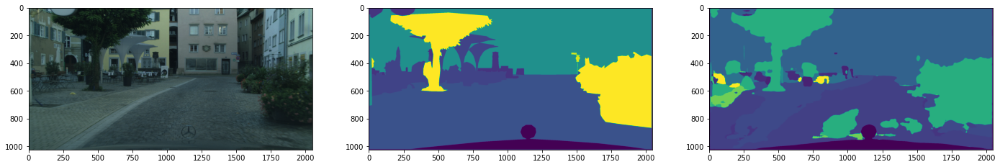

In [6]:
'''Plotting''';
with torch.no_grad():
    iterator = iter(val_loader)
    images, targets = next(iterator)
    images = images.to(device)

    model.eval().to(device)
    output = model(images.to(device))['out']
    pred = torch.argmax(output, dim=1)

    images = images.to('cpu')
    targets = targets.to('cpu')
    output = output.to('cpu')
    pred = pred.to('cpu')
    print('image: ', images.shape)
    print('target:', targets.shape)
    print('output:', output.shape)
    print('pred:  ', pred.shape)
    fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
    ax[0].imshow(images[1].squeeze().permute(1,2,0))  # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
    ax[1].imshow(targets[1].squeeze()) # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
    ax[2].imshow(pred[1].squeeze())